In [91]:
# Importing libraries and data
# Data-visualization
# Data preprocessing
# PCA
# Implementing various ML models
# Analyzing results and implementing ensembling
# Applying data augmentation

In [84]:
#importing necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib as mpl
import numpy as np
import seaborn as sns
%matplotlib inline
import warnings

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn import metrics as m
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import ShuffleSplit
from sklearn.metrics import roc_auc_score
from sklearn.neural_network import MLPClassifier
import lightgbm as lgb
from scipy.stats import norm, skew
from sklearn.model_selection import GridSearchCV

pd.options.mode.chained_assignment = None
pd.options.display.max_columns = 999
from pandas.io.json import json_normalize
import json
from sklearn import model_selection, preprocessing, metrics
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import StratifiedKFold

In [2]:
#importing test and train datasets
train = pd.read_csv("train.csv") 
test = pd.read_csv("test.csv") 

In [4]:
#high-level view of the dataset
train.shape
test.shape

(200000, 201)

In [3]:
#looking at the first five rows of the training dataset along with the row headers
train.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


In [61]:
#check for null or missing values in the training dataset
sum(train.isna().sum())

0

In [6]:
#removing duplicate features from the training dataset
#no direct method to find duplicates, follow long procedure
#transpose dataset
train_T = train.T  
train_T.shape 

(202, 200000)

In [7]:
# in pandas we have duplicated() method which can help us find duplicate rows from the dataframe. 
# Remember, the rows of the transposed dataframe are actually the columns or 
# the features of the actual dataframe.
print(train_T.duplicated().sum()) 

0


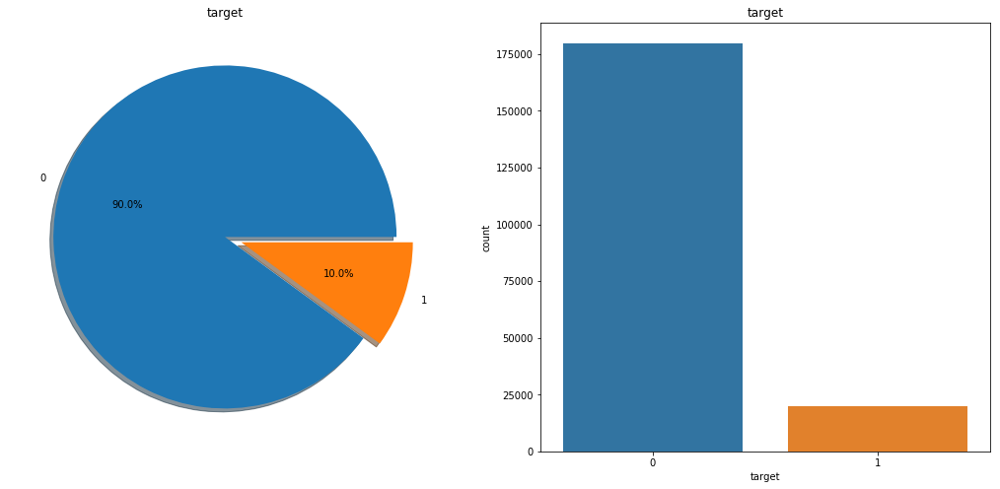

In [9]:
#check the distribution of target value in train dataset.
f,ax=plt.subplots(1,2,figsize=(18,8))
train['target'].value_counts().plot.pie(explode=[0,0.1],autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title('target')
ax[0].set_ylabel('')
sns.countplot('target',data=train,ax=ax[1])
ax[1].set_title('target')
plt.show()

In [ ]:
# clearly shows that the dataset is imbalanced

In [41]:
#construct scatter plots for all the features in the dataset

def plot_feature_distribution(df1, features):
    i = 0
    sns.set_style('whitegrid')
    plt.figure()
    fig, ax = plt.subplots(25,8, figsize=(16,32))

    count=0
    for feature in features:
        
        i += 1
        plt.subplot(25,8,i)
        plt.boxplot(df1[feature])
        plt.xlabel(feature, fontsize=12)
#         plt.ylabel(feature, fontsize=9)
#         locs, labels = plt.xticks()
#         plt.tick_params(axis='x', which='major', labelsize=6, pad=-6)
#         plt.tick_params(axis='y', which='major', labelsize=6)
        count=count+1
#     fig.savefig(r'C:\Users\Ayushi.Goel\Documents\Work\Santandar Competition Kaggle\Plots\var_77.png')   # save the figure to file
#     plt.close(fig)    # close the figure
    plt.show(); 

<Figure size 432x288 with 0 Axes>

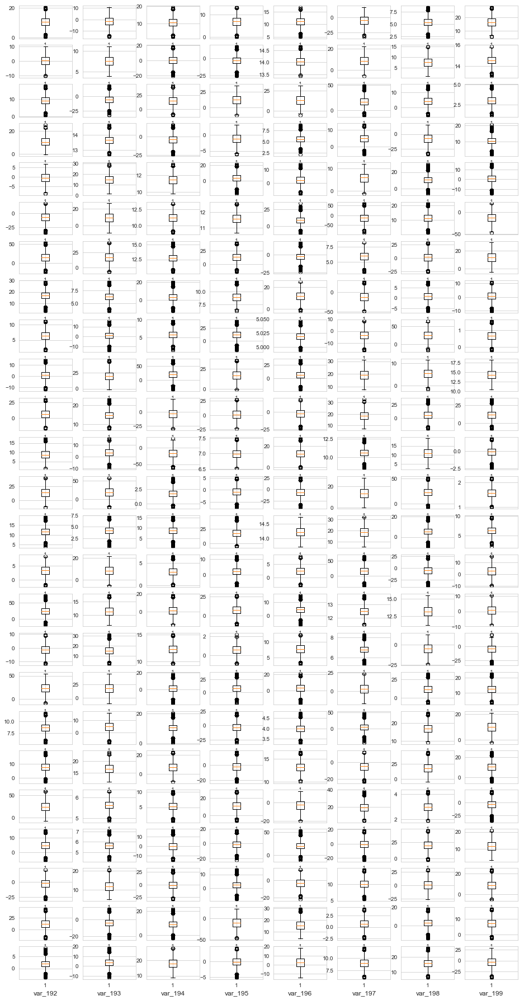

In [42]:
#calling function for the scatter plot 
features = train.columns.values[2:202]
plot_feature_distribution(train , features)

In [ ]:
# The box plots show that almost all features are normal and do not show any sort of skewness among them. 
# Also, we cannot find any abnormal outliers in any of the feature

In [13]:
#finding pearson correlation between all the features
correlations = train[features].corr().abs().unstack().sort_values(kind="quicksort").reset_index()
correlations = correlations[correlations['level_0'] != correlations['level_1']]

In [64]:
#highest correlated
correlations.tail(10)

,level_0,level_1,0
39790,var_183,var_189,0.009359
39791,var_189,var_183,0.009359
39792,var_174,var_81,0.009490
39793,var_81,var_174,0.009490
39794,var_81,var_165,0.009714
39795,var_165,var_81,0.009714
39796,var_53,var_148,0.009788
39797,var_148,var_53,0.009788
39798,var_26,var_139,0.009844
39799,var_139,var_26,0.009844


In [65]:
#least correlated
correlations.head(10)

,level_0,level_1,0
0,var_75,var_191,2.703975e-08
1,var_191,var_75,2.703975e-08
2,var_173,var_6,5.942735e-08
3,var_6,var_173,5.942735e-08
4,var_126,var_109,1.313947e-07
5,var_109,var_126,1.313947e-07
6,var_144,var_27,1.772502e-07
7,var_27,var_144,1.772502e-07
8,var_177,var_100,3.116544e-07
9,var_100,var_177,3.116544e-07


In [66]:
corr = df.corr()
corr.style.background_gradient().set_precision(2)

In [67]:
#function to give the total features with correlation greater than a provided value
correlated_features = set()  
correlation_matrix = df.corr() 
for i in range(len(correlation_matrix.columns)):  
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.5: (#value above which we are looking for correlation )
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)

In [68]:
len(correlated_features)

0

In [ ]:
# results show that none of the features show strong linear correlation with other features or the traget variable

In [71]:
#checking for constant or quasi-constant features(features that have values that do not vary much and are almost constant)
df1 = train
from sklearn.model_selection import train_test_split  
from sklearn.feature_selection import VarianceThreshold
df1.reset_index()
df1 = df1.drop(['ID_code'], axis=1)
df1.head()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,-4.9193,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,-5.8609,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,6.2654,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


In [74]:
train_features, test_features, train_labels, test_labels=train_test_split(  
    df1.drop(labels=['target'], axis=1),
    df1['target'],
    test_size=0.2,
    random_state=41)

In [75]:
qconstant_filter = VarianceThreshold(threshold=0.01) 
qconstant_filter.fit(train_features) 
len(train_features.columns[qconstant_filter.get_support()])

199

In [76]:
qconstant_columns = [column for column in train_features.columns  
                    if column not in train_features.columns[qconstant_filter.get_support()]]

print(len(qconstant_columns)) 

1


In [77]:
for column in qconstant_columns:  
    print(column)

var_68


In [ ]:
#The data seems to be pre-processed with no missing vales, no duplicate cells. The features are normalised and do not
#have person correlation with each other or the target variable directly.

#Hence we perform a PCA to check for a possible chance of dimensionality reduction. 

In [44]:
#implementing PCA
df_drop=train.drop(labels=['ID_code'],axis=1)
df_drop.head()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,-4.9193,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,-5.8609,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,6.2654,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


In [45]:
X = df_drop.iloc[:,1:202].values
y = df_drop.iloc[:,0].values #put the target column in a separate variable
X

array([[  8.9255,  -6.7863,  11.9081, ...,   8.5635,  12.7803,  -1.0914],
       [ 11.5006,  -4.1473,  13.8588, ...,   8.7889,  18.356 ,   1.9518],
       [  8.6093,  -2.7457,  12.0805, ...,   8.2675,  14.7222,   0.3965],
       ...,
       [ 11.2232,  -5.0518,  10.5127, ...,   8.7155,  13.8329,   4.1995],
       [  9.7148,  -8.6098,  13.6104, ...,  10.0342,  15.5289, -13.9001],
       [ 10.8762,  -5.7105,  12.1183, ...,   8.1857,  12.1284,   0.1385]])

In [46]:
from sklearn.preprocessing import StandardScaler
X_std = StandardScaler().fit_transform(X)

In [47]:
mean_vec = np.mean(X_std, axis=0)
cov_mat = (X_std - mean_vec).T.dot((X_std - mean_vec)) / (X_std.shape[0]-1)
print('Covariance matrix \n%s' %cov_mat)

Covariance matrix 
[[ 1.00000500e+00 -5.43701961e-04  6.57286666e-03 ... -7.52746424e-04
  -5.77572584e-03  3.84994710e-03]
 [-5.43701961e-04  1.00000500e+00  3.98051409e-03 ... -4.15698166e-03
  -4.86098030e-03  2.28713107e-03]
 [ 6.57286666e-03  3.98051409e-03  1.00000500e+00 ...  1.07819308e-03
  -8.77071574e-04  3.85485091e-03]
 ...
 [-7.52746424e-04 -4.15698166e-03  1.07819308e-03 ...  1.00000500e+00
   1.18252954e-03  4.99057990e-03]
 [-5.77572584e-03 -4.86098030e-03 -8.77071574e-04 ...  1.18252954e-03
   1.00000500e+00 -4.73058354e-03]
 [ 3.84994710e-03  2.28713107e-03  3.85485091e-03 ...  4.99057990e-03
  -4.73058354e-03  1.00000500e+00]]


In [48]:
eig_vals, eig_vecs = np.linalg.eig(cov_mat)

print('Eigenvectors \n%s' %eig_vecs)
print('\nEigenvalues \n%s' %eig_vals)

Eigenvectors 
[[ 0.11359715 -0.03960425  0.10926765 ... -0.0254684   0.01306865
  -0.00122   ]
 [ 0.10415697 -0.0362558   0.10124509 ... -0.04177453 -0.07605463
  -0.02920876]
 [ 0.12145297 -0.10815139 -0.0665506  ...  0.01154148  0.0583501
  -0.03584376]
 ...
 [-0.05731793  0.06940708  0.02551816 ...  0.03949949  0.11879054
   0.0571167 ]
 [-0.10942072 -0.01430036  0.02245841 ...  0.05226997 -0.02193812
  -0.00346688]
 [ 0.07395645 -0.07875135 -0.0242946  ... -0.06137017  0.02833766
  -0.00052045]]

Eigenvalues 
[1.22262234 0.93814673 0.9398077  0.93929554 1.06053954 1.05972959
 1.05935073 1.0575937  1.05654297 1.0559005  1.05485824 1.05313637
 1.05257194 1.05111478 1.04999324 0.9426749  0.94346696 0.9455703
 0.94626034 0.94690907 1.04921006 1.04737953 1.04716789 1.04701259
 1.04545951 1.04476914 1.04299901 1.04385827 1.04365811 0.94954282
 0.94801412 0.94840852 1.04204096 1.0414636  1.03995595 1.04048843
 0.95043082 0.95206625 0.95128629 1.03890486 1.03860306 1.03851713
 0.95235229 0

In [49]:
# Make a list of (eigenvalue, eigenvector) tuples
eig_pairs = [(np.abs(eig_vals[i]), eig_vecs[:,i]) for i in range(len(eig_vals))]

# Sort the (eigenvalue, eigenvector) tuples from high to low
eig_pairs.sort(key=lambda x: x[0], reverse=True)

# Visually confirm that the list is correctly sorted by decreasing eigenvalues
print('Eigenvalues in descending order:')
for i in eig_pairs:
    print(i[0])

Eigenvalues in descending order:
1.2226223384117847
1.0605395418172845
1.059729587630163
1.0593507326915872
1.057593704744194
1.0565429663904007
1.0559004955830948
1.0548582354716032
1.0531363740490716
1.052571935151674
1.051114779633787
1.04999323950075
1.0492100640732367
1.047379527296312
1.0471678890149012
1.0470125858482953
1.0454595126776245
1.044769137885055
1.0438582659781557
1.043658106753509
1.042999014739071
1.0420409582057937
1.0414635966982904
1.0404884319639824
1.039955950629386
1.0389048567444898
1.0386030613466897
1.0385171333112528
1.0374978755706918
1.0367024949180108
1.0365837699386813
1.035665563895969
1.0347938269299644
1.0338478212189146
1.0332695071904827
1.0331998276116843
1.0324888607828397
1.0319585168650152
1.0309419012266943
1.0306764933542591
1.029902424242676
1.0290001551571113
1.0285229118049584
1.0282264360971043
1.0274120997986789
1.0268975253684784
1.026370620366142
1.0258101347246842
1.0255747154186077
1.0250323869414835
1.0238184359615266
1.0235542736

In [50]:
tot = sum(eig_vals)
var_exp = [(i / tot)*100 for i in sorted(eig_vals, reverse=True)]

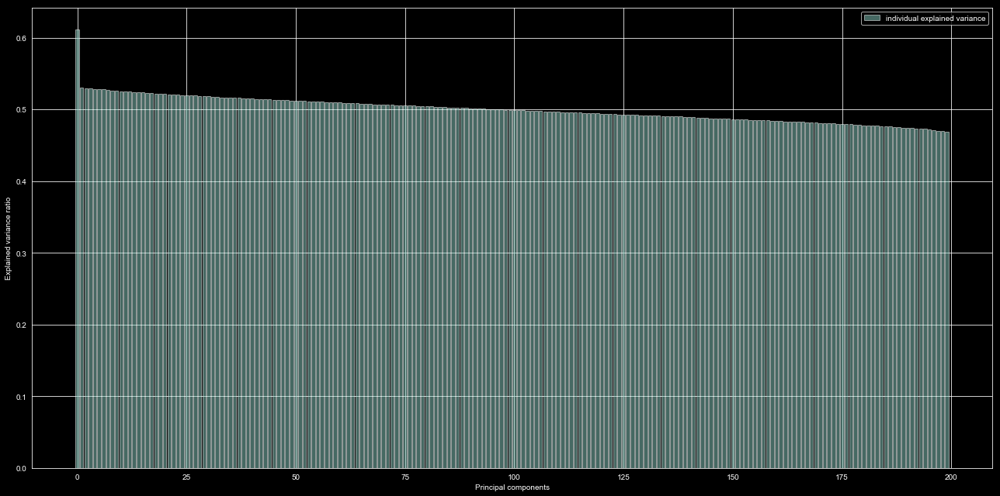

In [51]:
with plt.style.context('dark_background'):
    plt.figure(figsize=(18, 9))

    plt.bar(range(200), var_exp, alpha=0.5, align='center',
            label='individual explained variance')
    plt.ylabel('Explained variance ratio')
    plt.xlabel('Principal components')
    plt.legend(loc='best')
    plt.tight_layout()

In [53]:
#results show that all of the features for this dataset are important 
# and hence we cannot reduce features with the help of PCA

# simplying applying various ML models to the above dataset
# models applied include:
#     (i) Gradient Boosting Classifier
#     (ii)Adaptive Boosting Classifier
#     (iii)Neural Network
#     (iv)Logistic Regression
#     (v)Random Forest Classifier
#     (vi)K Nearest Neighbour

# for all of these models, accuracy, fscore, precison, recall and roc_auc score has been calculated


In [57]:
classifiers = {'Gradient Boosting Classifier':GradientBoostingClassifier(),
                'Adaptive Boosting Classifier':AdaBoostClassifier(),
                'Neural Network':MLPClassifier(),
                'Logistic Regression':LogisticRegression(),
                'Random Forest Classifier': RandomForestClassifier()
                'K Nearest Neighbour': KNearestNeighbour()}

In [7]:
data_y = pd.DataFrame(train['target'])
data_X = train.drop(['ID_code','target'],axis=1)
# print(data_X.columns)
log_cols = ["Classifier", "Accuracy","Precision Score","Recall Score","F1-Score","roc-auc_Score"]
#metrics_cols = []
log = pd.DataFrame(columns=log_cols)

                     Classifier  Accuracy  Precision Score  Recall Score  \
0  Gradient Boosting Classifier   0.90265         0.891244      0.517050   
0  Adaptive Boosting Classifier   0.90650         0.775332      0.574193   
0                Neural Network   0.90300         0.727442      0.639424   
0           Logistic Regression   0.91395         0.800355      0.629131   
0      Random Forest Classifier   0.89945         0.683993      0.506197   
0           K Nearest Neighbour   0.89960         0.449822      0.499972   

   F1-Score  roc-auc_Score  
0  0.507641       0.891244  
0  0.601958       0.775332  
0  0.668910       0.727442  
0  0.671283       0.800355  
0  0.487273       0.683993  
0  0.473573       0.449822  


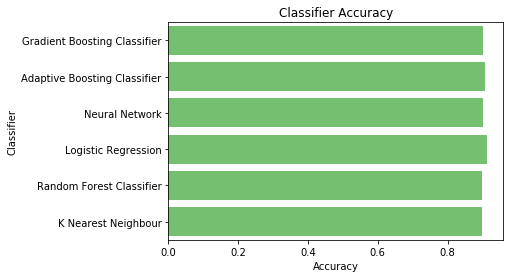

In [14]:
import warnings
warnings.filterwarnings('ignore')
rs = ShuffleSplit(n_splits=1, test_size=0.2,random_state=0)
rs.get_n_splits(data_X,data_y)
for Name,classify in classifiers.items():
    for train_index, test_index in rs.split(data_X,data_y):
        #print("TRAIN:", train_index, "TEST:", test_index)
        X,X_test = data_X.iloc[train_index], data_X.iloc[test_index]
        y,y_test = data_y.iloc[train_index], data_y.iloc[test_index]
        cls = classify
        cls =cls.fit(X,y)
        y_out = cls.predict(X_test)
        accuracy = accuracy_score(y_test,y_out)
        precision = m.precision_score(y_test,y_out,average='macro')
        recall = m.recall_score(y_test,y_out,average='macro')
        f1_score = m.f1_score(y_test,y_out,average='macro')
        roc_auc = roc_auc_score(y_out,y_test)
        log_entry = pd.DataFrame([[Name,accuracy,precision,recall,f1_score,roc_auc]], columns=log_cols)
        
        log = log.append(log_entry)
        #metric = metric.append(metric_entry)
    
print(log)
plt.xlabel('Accuracy')
plt.title('Classifier Accuracy')
sns.set_color_codes("muted")
sns.barplot(x='Accuracy', y='Classifier', data=log, color="g")  
plt.show()

[0 1]
            Classifier  Accuracy  Precision Score  Recall Score  F1-Score  \
0  Logistic Regression   0.91395         0.800355      0.629131  0.671283   

   roc-auc_Score  
0       0.800355  


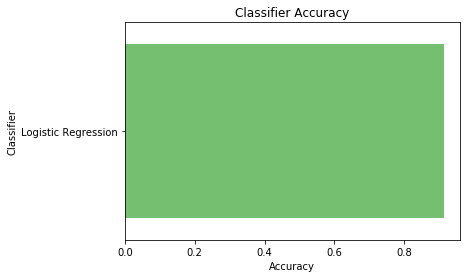

In [8]:
#just to confirm if the logistic regression is even predicting the value "1", since this is a highly imbalanced class

import warnings
warnings.filterwarnings('ignore')
rs = ShuffleSplit(n_splits=1, test_size=0.2,random_state=0)
rs.get_n_splits(data_X,data_y)
for Name,classify in classifiers.items():
    for train_index, test_index in rs.split(data_X,data_y):
        #print("TRAIN:", train_index, "TEST:", test_index)
        X,X_test = data_X.iloc[train_index], data_X.iloc[test_index]
        y,y_test = data_y.iloc[train_index], data_y.iloc[test_index]
        cls = classify
        cls =cls.fit(X,y)
        y_out = cls.predict(X_test)
        print( np.unique( y_out ) ) (#the algo is predicting both "0" and "1")
        accuracy = accuracy_score(y_test,y_out)
        precision = m.precision_score(y_test,y_out,average='macro')
        recall = m.recall_score(y_test,y_out,average='macro')
        f1_score = m.f1_score(y_test,y_out,average='macro')
        roc_auc = roc_auc_score(y_out,y_test)
        log_entry = pd.DataFrame([[Name,accuracy,precision,recall,f1_score,roc_auc]], columns=log_cols)
        
        log = log.append(log_entry)
        #metric = metric.append(metric_entry)
    
print(log)
plt.xlabel('Accuracy')
plt.title('Classifier Accuracy')
sns.set_color_codes("muted")
sns.barplot(x='Accuracy', y='Classifier', data=log, color="g")  
plt.show()

In [62]:
#the dataset is highly imbalanced and therefore a good measure of the prediction of the models would be the roc_auc score
#which is the highest in case of gradient boosting but when using the same over the test dataset gives a score of 0.66 
#on the leaderboard.

#therefore, we go for other methods to increase the roc score and the first among them is Ensembling.
#there are three methods of ensembling:
# a. simple averaging
# b. bagging
# c. boosting
#         boosting again has three very popular methods:
#             (i)XGBoost
#             (ii)lightGBM
#             (iii)CatBoost
# in this problem we will use lightgbm as a method to improve our model's score

# In Boosting algorithms each classifier is trained on data, taking into account the previous classifiers’ success. 
# After each training step, the weights are redistributed. Misclassified data increases its weights to emphasise 
# the most difficult cases. In this way, subsequent learners will focus on them during their training.
# Therefore, boosting works better than bagging in problems having imbalanced dataset.

# lightgbm is chosen over the two because it is much faster as compared to XGBoost and CatBoost is a good choice 
# when we have categorical variables, since all the features are numerical, lighgbm is the best option

In [64]:
test_df = test
train_df = train

test_ID = test_df['ID_code'].values
train_df = train_df.drop("ID_code",axis=1)
test_df = test_df.drop("ID_code",axis=1)

In [65]:
target_col = "target"

In [66]:
params = {
        "objective" : "binary",
        "metric" : "auc",
        "max_depth" : -1,
        "num_leaves" : 8,
        "min_data_in_leaf" : 25,
        "learning_rate" : 0.006,
        "bagging_fraction" : 0.2,
        "feature_fraction" : 0.4,
        "bagging_freq" : 1,
        "lambda_l1" : 5,
        "lambda_l2" : 5,
        "verbosity" : 1,
        "max_bin": 512,
        "num_threads" : 6
    }

In [92]:
# all three boosting algorithms have an array of hyper-parameters and choosing the best combination of them to get the 
# maximum is a big challenge. One way to cope with this is to use grid search. 

# Grid search is a method to perform hyper-parameter optimisation, that is, it is a method to find 
# the best combination of hyper-parameters (an example of an hyper-parameter is the learning rate of the optimiser), 
# for a given model (e.g. lightGBM) and test dataset. In this scenario, there are several models, each with a different 
# combination of hyper-parameters. Each of these combinations of parameters, which correspond to a single model, 
# can be said to lie on a point of a "grid". The goal is then to train each of these models and evaluate 
# them e.g. using cross-validation. Then select the one that performed best.

In [67]:
# Create parameters to search
gridParams = {
    'learning_rate': [0.005],
    'n_estimators': [2000],
    'num_leaves': [4,2],
    'colsample_bytree' : [0.7,0.07],
    'reg_alpha' : [1,1.2,7],
    'reg_lambda' : [5,5.5,0.6],
    'subsample' : [0.7,0.07],
    'objective' : ['binary'],
    'boosting_type' : ['gbdt'],
}

In [68]:
train_y = train_df[target_col].values
features = [c for c in train_df.columns if c not in ['target']]
train_df = train_df.drop("target",axis=1)
train_X = train_df
test_X = test_df

In [69]:
lgtrain = lgb.Dataset(train_X, label=train_y)
#lgval = lgb.Dataset(val_X, label=val_y)
evals_result = {}

In [70]:
# Create classifier to use. Note that parameters have to be input manually
# not as a dict!
mdl = lgb.LGBMClassifier(boosting_type= 'gbdt',
          objective = 'binary',
          n_jobs = 6, # Updated from 'nthread'
          silent = True,
          max_depth = params['max_depth'],
          max_bin = params['max_bin'])

In [71]:
# Create the grid
grid = GridSearchCV(mdl, gridParams,scoring='roc_auc',
                    verbose=0,
                    cv=4,
                    n_jobs=8)

In [72]:
# Run the grid
grid.fit(train_X, train_y)

GridSearchCV(cv=4, error_score='raise-deprecating',
       estimator=LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
        importance_type='split', learning_rate=0.1, max_bin=512,
        max_depth=-1, min_child_samples=20, min_child_weight=0.001,
        min_split_gain=0.0, n_estimators=100, n_jobs=6, num_leaves=31,
        objective='binary', random_state=None, reg_alpha=0.0,
        reg_lambda=0.0, silent=True, subsample=1.0,
        subsample_for_bin=200000, subsample_freq=0),
       fit_params=None, iid='warn', n_jobs=8,
       param_grid={'learning_rate': [0.005], 'n_estimators': [2000], 'num_leaves': [4, 2], 'colsample_bytree': [0.7, 0.07], 'reg_alpha': [1, 1.2, 7], 'reg_lambda': [5, 5.5, 0.6], 'subsample': [0.7, 0.07], 'objective': ['binary'], 'boosting_type': ['gbdt']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=0)

In [73]:
print(grid.best_params_)
print(grid.best_score_)

{'boosting_type': 'gbdt', 'colsample_bytree': 0.07, 'learning_rate': 0.005, 'n_estimators': 2000, 'num_leaves': 4, 'objective': 'binary', 'reg_alpha': 1.2, 'reg_lambda': 0.6, 'subsample': 0.7}
0.8403487192000508


In [74]:
params['feature_fraction'] = grid.best_params_['colsample_bytree']
params['learning_rate'] = grid.best_params_['learning_rate']
# params['max_bin'] = grid.best_params_['max_bin']
params['num_leaves'] = grid.best_params_['num_leaves']
params['lambda_l1'] = grid.best_params_['reg_alpha']
params['lambda_l2'] = grid.best_params_['reg_lambda']
params['bagging_fraction'] = grid.best_params_['subsample']
numberOfEstimators = grid.best_params_['n_estimators']

In [75]:
def run_lgb(train_X, train_y, val_X, val_y, test_X,params):    
    lgtrain = lgb.Dataset(train_X, label=train_y)
    lgval = lgb.Dataset(val_X, label=val_y)
    evals_result = {}
    model = lgb.train(params, lgtrain, 300000, valid_sets=[lgtrain,lgval], early_stopping_rounds=500, verbose_eval=100, evals_result=evals_result)
    pred_test_y = model.predict(test_X, num_iteration=model.best_iteration)
    return pred_test_y, model, evals_result

In [78]:
pred_test = 0
kf = model_selection.KFold(n_splits=6, random_state=2018, shuffle=True)
feature_importance_df = pd.DataFrame()
for dev_index, val_index in kf.split(train_df):
    dev_X, val_X = train_X.loc[dev_index,:], train_X.loc[val_index,:]
    dev_y, val_y = train_y[dev_index], train_y[val_index]
    
    pred_test_tmp, model, evals_result = run_lgb(dev_X, dev_y, val_X, val_y, test_X,params)
    
    fold_importance_df = pd.DataFrame()
    fold_importance_df["feature"] = features
    fold_importance_df["importance"] = model.feature_importance()
    #fold_importance_df["fold"] = dev_index + 1
    feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
        
    pred_test += pred_test_tmp / 6

Training until validation scores don't improve for 500 rounds.
[100]	training's auc: 0.812493	valid_1's auc: 0.804858
[200]	training's auc: 0.814449	valid_1's auc: 0.80524
[300]	training's auc: 0.820243	valid_1's auc: 0.810761
[400]	training's auc: 0.822522	valid_1's auc: 0.813774
[500]	training's auc: 0.824764	valid_1's auc: 0.815334
[600]	training's auc: 0.827894	valid_1's auc: 0.81825
[700]	training's auc: 0.831338	valid_1's auc: 0.821569
[800]	training's auc: 0.832916	valid_1's auc: 0.823159
[900]	training's auc: 0.835107	valid_1's auc: 0.824953
[1000]	training's auc: 0.837011	valid_1's auc: 0.826837
[1100]	training's auc: 0.839236	valid_1's auc: 0.828744
[1200]	training's auc: 0.841113	valid_1's auc: 0.83074
[1300]	training's auc: 0.843289	valid_1's auc: 0.832713
[1400]	training's auc: 0.844692	valid_1's auc: 0.834061
[1500]	training's auc: 0.846323	valid_1's auc: 0.835368
[1600]	training's auc: 0.847814	valid_1's auc: 0.836751
[1700]	training's auc: 0.849386	valid_1's auc: 0.8383

[14700]	training's auc: 0.909953	valid_1's auc: 0.891715
[14800]	training's auc: 0.910069	valid_1's auc: 0.891804
[14900]	training's auc: 0.910213	valid_1's auc: 0.891918
[15000]	training's auc: 0.910336	valid_1's auc: 0.892003
[15100]	training's auc: 0.910463	valid_1's auc: 0.892105
[15200]	training's auc: 0.910568	valid_1's auc: 0.892185
[15300]	training's auc: 0.910686	valid_1's auc: 0.892281
[15400]	training's auc: 0.910809	valid_1's auc: 0.892368
[15500]	training's auc: 0.910922	valid_1's auc: 0.892471
[15600]	training's auc: 0.911034	valid_1's auc: 0.892559
[15700]	training's auc: 0.911159	valid_1's auc: 0.892628
[15800]	training's auc: 0.911281	valid_1's auc: 0.892711
[15900]	training's auc: 0.91139	valid_1's auc: 0.892804
[16000]	training's auc: 0.911507	valid_1's auc: 0.892881
[16100]	training's auc: 0.911628	valid_1's auc: 0.892962
[16200]	training's auc: 0.911747	valid_1's auc: 0.893052
[16300]	training's auc: 0.911858	valid_1's auc: 0.893125
[16400]	training's auc: 0.911966

[29200]	training's auc: 0.921174	valid_1's auc: 0.898014
[29300]	training's auc: 0.921228	valid_1's auc: 0.898031
[29400]	training's auc: 0.921285	valid_1's auc: 0.898046
[29500]	training's auc: 0.92134	valid_1's auc: 0.898052
[29600]	training's auc: 0.921395	valid_1's auc: 0.898074
[29700]	training's auc: 0.92145	valid_1's auc: 0.898076
[29800]	training's auc: 0.921505	valid_1's auc: 0.898077
[29900]	training's auc: 0.921559	valid_1's auc: 0.898093
[30000]	training's auc: 0.921615	valid_1's auc: 0.898106
[30100]	training's auc: 0.921677	valid_1's auc: 0.898112
[30200]	training's auc: 0.921732	valid_1's auc: 0.898124
[30300]	training's auc: 0.92179	valid_1's auc: 0.89814
[30400]	training's auc: 0.921843	valid_1's auc: 0.898145
[30500]	training's auc: 0.9219	valid_1's auc: 0.898152
[30600]	training's auc: 0.921955	valid_1's auc: 0.89815
[30700]	training's auc: 0.922006	valid_1's auc: 0.898172
[30800]	training's auc: 0.922056	valid_1's auc: 0.898178
[30900]	training's auc: 0.92211	valid_

[4800]	training's auc: 0.879852	valid_1's auc: 0.871035
[4900]	training's auc: 0.880543	valid_1's auc: 0.871564
[5000]	training's auc: 0.88127	valid_1's auc: 0.872145
[5100]	training's auc: 0.881876	valid_1's auc: 0.8727
[5200]	training's auc: 0.882624	valid_1's auc: 0.873253
[5300]	training's auc: 0.883357	valid_1's auc: 0.873818
[5400]	training's auc: 0.884045	valid_1's auc: 0.874388
[5500]	training's auc: 0.884623	valid_1's auc: 0.874837
[5600]	training's auc: 0.885184	valid_1's auc: 0.875264
[5700]	training's auc: 0.885726	valid_1's auc: 0.875657
[5800]	training's auc: 0.886311	valid_1's auc: 0.876093
[5900]	training's auc: 0.886822	valid_1's auc: 0.87648
[6000]	training's auc: 0.887408	valid_1's auc: 0.876898
[6100]	training's auc: 0.887901	valid_1's auc: 0.87727
[6200]	training's auc: 0.888393	valid_1's auc: 0.877637
[6300]	training's auc: 0.888902	valid_1's auc: 0.877955
[6400]	training's auc: 0.889445	valid_1's auc: 0.87837
[6500]	training's auc: 0.889918	valid_1's auc: 0.87874

[19400]	training's auc: 0.915074	valid_1's auc: 0.895158
[19500]	training's auc: 0.915155	valid_1's auc: 0.895204
[19600]	training's auc: 0.915234	valid_1's auc: 0.895249
[19700]	training's auc: 0.915316	valid_1's auc: 0.895302
[19800]	training's auc: 0.915398	valid_1's auc: 0.895345
[19900]	training's auc: 0.915482	valid_1's auc: 0.895383
[20000]	training's auc: 0.91556	valid_1's auc: 0.895417
[20100]	training's auc: 0.915651	valid_1's auc: 0.895452
[20200]	training's auc: 0.915725	valid_1's auc: 0.895483
[20300]	training's auc: 0.915802	valid_1's auc: 0.89552
[20400]	training's auc: 0.915878	valid_1's auc: 0.895564
[20500]	training's auc: 0.915956	valid_1's auc: 0.895615
[20600]	training's auc: 0.91603	valid_1's auc: 0.895655
[20700]	training's auc: 0.916108	valid_1's auc: 0.895702
[20800]	training's auc: 0.91618	valid_1's auc: 0.895727
[20900]	training's auc: 0.91625	valid_1's auc: 0.895758
[21000]	training's auc: 0.916319	valid_1's auc: 0.895793
[21100]	training's auc: 0.916403	val

[33900]	training's auc: 0.924049	valid_1's auc: 0.89762
[34000]	training's auc: 0.924102	valid_1's auc: 0.897624
[34100]	training's auc: 0.924156	valid_1's auc: 0.897627
[34200]	training's auc: 0.924208	valid_1's auc: 0.897642
[34300]	training's auc: 0.92426	valid_1's auc: 0.897652
[34400]	training's auc: 0.924314	valid_1's auc: 0.89765
[34500]	training's auc: 0.924371	valid_1's auc: 0.89765
[34600]	training's auc: 0.924427	valid_1's auc: 0.897657
[34700]	training's auc: 0.924475	valid_1's auc: 0.89765
[34800]	training's auc: 0.924532	valid_1's auc: 0.897657
[34900]	training's auc: 0.924589	valid_1's auc: 0.897659
[35000]	training's auc: 0.924638	valid_1's auc: 0.897665
[35100]	training's auc: 0.924689	valid_1's auc: 0.897671
[35200]	training's auc: 0.924745	valid_1's auc: 0.897679
[35300]	training's auc: 0.9248	valid_1's auc: 0.897684
[35400]	training's auc: 0.92485	valid_1's auc: 0.897686
[35500]	training's auc: 0.924904	valid_1's auc: 0.897695
[35600]	training's auc: 0.924956	valid_

[10900]	training's auc: 0.903087	valid_1's auc: 0.888767
[11000]	training's auc: 0.903296	valid_1's auc: 0.888961
[11100]	training's auc: 0.903499	valid_1's auc: 0.889119
[11200]	training's auc: 0.903689	valid_1's auc: 0.889279
[11300]	training's auc: 0.90392	valid_1's auc: 0.889474
[11400]	training's auc: 0.904118	valid_1's auc: 0.889625
[11500]	training's auc: 0.90432	valid_1's auc: 0.889778
[11600]	training's auc: 0.904528	valid_1's auc: 0.889941
[11700]	training's auc: 0.904741	valid_1's auc: 0.89012
[11800]	training's auc: 0.904929	valid_1's auc: 0.89025
[11900]	training's auc: 0.905124	valid_1's auc: 0.890388
[12000]	training's auc: 0.905303	valid_1's auc: 0.890544
[12100]	training's auc: 0.905504	valid_1's auc: 0.890702
[12200]	training's auc: 0.905681	valid_1's auc: 0.890869
[12300]	training's auc: 0.905829	valid_1's auc: 0.891004
[12400]	training's auc: 0.906019	valid_1's auc: 0.891146
[12500]	training's auc: 0.906183	valid_1's auc: 0.891273
[12600]	training's auc: 0.906351	va

[25400]	training's auc: 0.918537	valid_1's auc: 0.899194
[25500]	training's auc: 0.9186	valid_1's auc: 0.899224
[25600]	training's auc: 0.918665	valid_1's auc: 0.899239
[25700]	training's auc: 0.918721	valid_1's auc: 0.899258
[25800]	training's auc: 0.918781	valid_1's auc: 0.899274
[25900]	training's auc: 0.918841	valid_1's auc: 0.899297
[26000]	training's auc: 0.918899	valid_1's auc: 0.899324
[26100]	training's auc: 0.918957	valid_1's auc: 0.899348
[26200]	training's auc: 0.919016	valid_1's auc: 0.899372
[26300]	training's auc: 0.919074	valid_1's auc: 0.899398
[26400]	training's auc: 0.919134	valid_1's auc: 0.899433
[26500]	training's auc: 0.919197	valid_1's auc: 0.899458
[26600]	training's auc: 0.919255	valid_1's auc: 0.899487
[26700]	training's auc: 0.919313	valid_1's auc: 0.899503
[26800]	training's auc: 0.919371	valid_1's auc: 0.899527
[26900]	training's auc: 0.91943	valid_1's auc: 0.899533
[27000]	training's auc: 0.919485	valid_1's auc: 0.899558
[27100]	training's auc: 0.91955	va

[2200]	training's auc: 0.855698	valid_1's auc: 0.843484
[2300]	training's auc: 0.856732	valid_1's auc: 0.844433
[2400]	training's auc: 0.857816	valid_1's auc: 0.845304
[2500]	training's auc: 0.859	valid_1's auc: 0.846364
[2600]	training's auc: 0.860163	valid_1's auc: 0.847525
[2700]	training's auc: 0.861252	valid_1's auc: 0.848687
[2800]	training's auc: 0.862357	valid_1's auc: 0.849594
[2900]	training's auc: 0.863363	valid_1's auc: 0.850517
[3000]	training's auc: 0.86449	valid_1's auc: 0.851634
[3100]	training's auc: 0.865494	valid_1's auc: 0.852518
[3200]	training's auc: 0.866578	valid_1's auc: 0.853475
[3300]	training's auc: 0.867623	valid_1's auc: 0.854429
[3400]	training's auc: 0.868641	valid_1's auc: 0.855358
[3500]	training's auc: 0.869575	valid_1's auc: 0.856248
[3600]	training's auc: 0.870347	valid_1's auc: 0.856964
[3700]	training's auc: 0.871246	valid_1's auc: 0.857853
[3800]	training's auc: 0.872129	valid_1's auc: 0.85861
[3900]	training's auc: 0.872999	valid_1's auc: 0.8594

[16800]	training's auc: 0.91238	valid_1's auc: 0.893551
[16900]	training's auc: 0.912472	valid_1's auc: 0.893644
[17000]	training's auc: 0.912579	valid_1's auc: 0.893722
[17100]	training's auc: 0.912684	valid_1's auc: 0.893796
[17200]	training's auc: 0.912788	valid_1's auc: 0.893886
[17300]	training's auc: 0.912892	valid_1's auc: 0.89394
[17400]	training's auc: 0.912989	valid_1's auc: 0.893986
[17500]	training's auc: 0.913091	valid_1's auc: 0.894069
[17600]	training's auc: 0.913186	valid_1's auc: 0.89411
[17700]	training's auc: 0.913291	valid_1's auc: 0.894197
[17800]	training's auc: 0.913386	valid_1's auc: 0.894265
[17900]	training's auc: 0.913477	valid_1's auc: 0.894346
[18000]	training's auc: 0.913561	valid_1's auc: 0.89441
[18100]	training's auc: 0.913651	valid_1's auc: 0.894489
[18200]	training's auc: 0.913737	valid_1's auc: 0.894546
[18300]	training's auc: 0.913828	valid_1's auc: 0.894588
[18400]	training's auc: 0.913921	valid_1's auc: 0.894642
[18500]	training's auc: 0.914012	va

[31300]	training's auc: 0.922332	valid_1's auc: 0.898298
[31400]	training's auc: 0.922387	valid_1's auc: 0.898311
[31500]	training's auc: 0.922436	valid_1's auc: 0.898317
[31600]	training's auc: 0.922485	valid_1's auc: 0.898328
[31700]	training's auc: 0.922545	valid_1's auc: 0.898332
[31800]	training's auc: 0.922601	valid_1's auc: 0.898342
[31900]	training's auc: 0.922652	valid_1's auc: 0.898354
[32000]	training's auc: 0.922707	valid_1's auc: 0.898367
[32100]	training's auc: 0.922763	valid_1's auc: 0.898365
[32200]	training's auc: 0.922818	valid_1's auc: 0.898374
[32300]	training's auc: 0.922873	valid_1's auc: 0.898373
[32400]	training's auc: 0.922924	valid_1's auc: 0.898388
[32500]	training's auc: 0.922978	valid_1's auc: 0.898401
[32600]	training's auc: 0.92303	valid_1's auc: 0.898404
[32700]	training's auc: 0.923082	valid_1's auc: 0.898405
[32800]	training's auc: 0.923138	valid_1's auc: 0.898411
[32900]	training's auc: 0.923187	valid_1's auc: 0.898426
[33000]	training's auc: 0.923241

[5900]	training's auc: 0.886024	valid_1's auc: 0.877096
[6000]	training's auc: 0.88654	valid_1's auc: 0.877527
[6100]	training's auc: 0.886994	valid_1's auc: 0.877927
[6200]	training's auc: 0.887497	valid_1's auc: 0.87838
[6300]	training's auc: 0.887977	valid_1's auc: 0.878772
[6400]	training's auc: 0.888461	valid_1's auc: 0.879215
[6500]	training's auc: 0.888939	valid_1's auc: 0.879618
[6600]	training's auc: 0.889377	valid_1's auc: 0.879979
[6700]	training's auc: 0.889822	valid_1's auc: 0.880375
[6800]	training's auc: 0.890277	valid_1's auc: 0.880756
[6900]	training's auc: 0.890701	valid_1's auc: 0.881111
[7000]	training's auc: 0.891094	valid_1's auc: 0.881486
[7100]	training's auc: 0.891484	valid_1's auc: 0.881821
[7200]	training's auc: 0.891874	valid_1's auc: 0.882149
[7300]	training's auc: 0.892279	valid_1's auc: 0.882513
[7400]	training's auc: 0.892657	valid_1's auc: 0.882839
[7500]	training's auc: 0.893059	valid_1's auc: 0.883178
[7600]	training's auc: 0.893443	valid_1's auc: 0.8

[20400]	training's auc: 0.915108	valid_1's auc: 0.899235
[20500]	training's auc: 0.915184	valid_1's auc: 0.899279
[20600]	training's auc: 0.91526	valid_1's auc: 0.899324
[20700]	training's auc: 0.915346	valid_1's auc: 0.899362
[20800]	training's auc: 0.915421	valid_1's auc: 0.89942
[20900]	training's auc: 0.915494	valid_1's auc: 0.899452
[21000]	training's auc: 0.915573	valid_1's auc: 0.899497
[21100]	training's auc: 0.915648	valid_1's auc: 0.899526
[21200]	training's auc: 0.915718	valid_1's auc: 0.899565
[21300]	training's auc: 0.91579	valid_1's auc: 0.899599
[21400]	training's auc: 0.915866	valid_1's auc: 0.899628
[21500]	training's auc: 0.915935	valid_1's auc: 0.899656
[21600]	training's auc: 0.916008	valid_1's auc: 0.899681
[21700]	training's auc: 0.916085	valid_1's auc: 0.89971
[21800]	training's auc: 0.916162	valid_1's auc: 0.89974
[21900]	training's auc: 0.916232	valid_1's auc: 0.89976
[22000]	training's auc: 0.916303	valid_1's auc: 0.899809
[22100]	training's auc: 0.916377	vali

[600]	training's auc: 0.827916	valid_1's auc: 0.819681
[700]	training's auc: 0.831168	valid_1's auc: 0.823131
[800]	training's auc: 0.832961	valid_1's auc: 0.824275
[900]	training's auc: 0.835214	valid_1's auc: 0.826173
[1000]	training's auc: 0.836802	valid_1's auc: 0.82747
[1100]	training's auc: 0.839067	valid_1's auc: 0.829385
[1200]	training's auc: 0.841143	valid_1's auc: 0.830966
[1300]	training's auc: 0.843339	valid_1's auc: 0.833023
[1400]	training's auc: 0.84478	valid_1's auc: 0.834341
[1500]	training's auc: 0.846307	valid_1's auc: 0.83561
[1600]	training's auc: 0.847827	valid_1's auc: 0.837016
[1700]	training's auc: 0.849311	valid_1's auc: 0.838462
[1800]	training's auc: 0.85068	valid_1's auc: 0.839651
[1900]	training's auc: 0.851851	valid_1's auc: 0.840752
[2000]	training's auc: 0.853249	valid_1's auc: 0.84196
[2100]	training's auc: 0.854188	valid_1's auc: 0.842807
[2200]	training's auc: 0.855524	valid_1's auc: 0.844173
[2300]	training's auc: 0.856561	valid_1's auc: 0.845168
[

[15300]	training's auc: 0.909942	valid_1's auc: 0.896548
[15400]	training's auc: 0.910071	valid_1's auc: 0.896669
[15500]	training's auc: 0.910179	valid_1's auc: 0.896735
[15600]	training's auc: 0.910295	valid_1's auc: 0.89682
[15700]	training's auc: 0.910415	valid_1's auc: 0.896884
[15800]	training's auc: 0.910521	valid_1's auc: 0.896987
[15900]	training's auc: 0.910643	valid_1's auc: 0.897109
[16000]	training's auc: 0.91075	valid_1's auc: 0.897214
[16100]	training's auc: 0.910856	valid_1's auc: 0.897315
[16200]	training's auc: 0.910973	valid_1's auc: 0.897417
[16300]	training's auc: 0.911086	valid_1's auc: 0.897514
[16400]	training's auc: 0.911196	valid_1's auc: 0.897594
[16500]	training's auc: 0.911297	valid_1's auc: 0.897684
[16600]	training's auc: 0.911405	valid_1's auc: 0.89778
[16700]	training's auc: 0.911501	valid_1's auc: 0.897864
[16800]	training's auc: 0.91161	valid_1's auc: 0.897947
[16900]	training's auc: 0.911701	valid_1's auc: 0.898022
[17000]	training's auc: 0.911803	va

[29800]	training's auc: 0.920646	valid_1's auc: 0.903265
[29900]	training's auc: 0.9207	valid_1's auc: 0.903285
[30000]	training's auc: 0.920754	valid_1's auc: 0.903315
[30100]	training's auc: 0.920809	valid_1's auc: 0.903321
[30200]	training's auc: 0.920861	valid_1's auc: 0.903336
[30300]	training's auc: 0.920921	valid_1's auc: 0.903353
[30400]	training's auc: 0.920975	valid_1's auc: 0.903364
[30500]	training's auc: 0.92103	valid_1's auc: 0.903375
[30600]	training's auc: 0.921082	valid_1's auc: 0.903391
[30700]	training's auc: 0.921136	valid_1's auc: 0.903395
[30800]	training's auc: 0.92119	valid_1's auc: 0.903411
[30900]	training's auc: 0.921241	valid_1's auc: 0.903429
[31000]	training's auc: 0.921296	valid_1's auc: 0.903444
[31100]	training's auc: 0.921354	valid_1's auc: 0.903463
[31200]	training's auc: 0.921413	valid_1's auc: 0.903478
[31300]	training's auc: 0.921463	valid_1's auc: 0.903493
[31400]	training's auc: 0.921517	valid_1's auc: 0.903523
[31500]	training's auc: 0.921572	va

In [93]:
# using lightGBM along with Grid search and KFold cross validation, gives an roc_auc score of 0.90 
# on the leaderboard

In [94]:
# to further improve the roc_auc score, we go for data augmentation and then apply lightGBM

In [79]:
train1=pd.read_csv("train.csv").drop("ID_code",axis=1)
test1=pd.read_csv("test.csv").drop("ID_code",axis=1)

In [86]:
def augment(train1,num_n=1,num_p=2):
    newtrain=[train1]
    
    n=train1[train1.target==0]
    for i in range(num_n):
        newtrain.append(n.apply(lambda x:x.values.take(np.random.permutation(len(n)))))
    
    for i in range(num_p):
        p=train1[train1.target>0]
        newtrain.append(p.apply(lambda x:x.values.take(np.random.permutation(len(p)))))
    return pd.concat(newtrain)

In [87]:
param = {
    'bagging_freq': 5,
    'bagging_fraction': 0.335,
    'boost_from_average':'false',
    'boost': 'gbdt',
    'feature_fraction': 0.041,
    'learning_rate': 0.0083,
    'max_depth': -1,
    'metric':'auc',
    'min_data_in_leaf': 80,
    'min_sum_hessian_in_leaf': 10.0,
    'num_leaves': 13,
    'num_threads': 8,
    'tree_learner': 'serial',
    'objective': 'binary', 
    'verbosity': -1
}

In [90]:
result=np.zeros(test.shape[0])

rskf = RepeatedStratifiedKFold(n_splits=5, n_repeats=5,random_state=10)
for counter,(train_index, valid_index) in enumerate(rskf.split(train1, train1.target),1):
    print (counter)
    
    #Train data
    t=train1.iloc[train_index]
    t=augment(t)
    trn_data = lgb.Dataset(t.drop("target",axis=1), label=t.target)
    
    #Validation data
    v=train1.iloc[valid_index]
    val_data = lgb.Dataset(v.drop("target",axis=1), label=v.target)
    
    #Training
    model = lgb.train(param, trn_data, 1000000, valid_sets = [trn_data, val_data], verbose_eval=500, early_stopping_rounds = 4000)
    result +=model.predict(test1)

1
Training until validation scores don't improve for 4000 rounds.
[500]	training's auc: 0.887778	valid_1's auc: 0.875251
[1000]	training's auc: 0.894211	valid_1's auc: 0.881753
[1500]	training's auc: 0.898687	valid_1's auc: 0.885625
[2000]	training's auc: 0.902166	valid_1's auc: 0.888568
[2500]	training's auc: 0.905033	valid_1's auc: 0.890856
[3000]	training's auc: 0.907168	valid_1's auc: 0.89243
[3500]	training's auc: 0.909153	valid_1's auc: 0.893874
[4000]	training's auc: 0.910939	valid_1's auc: 0.895107
[4500]	training's auc: 0.912407	valid_1's auc: 0.895936
[5000]	training's auc: 0.913841	valid_1's auc: 0.896753
[5500]	training's auc: 0.915154	valid_1's auc: 0.897437
[6000]	training's auc: 0.916404	valid_1's auc: 0.897988
[6500]	training's auc: 0.917568	valid_1's auc: 0.898413
[7000]	training's auc: 0.918664	valid_1's auc: 0.898761
[7500]	training's auc: 0.919716	valid_1's auc: 0.899061
[8000]	training's auc: 0.9207	valid_1's auc: 0.899408
[8500]	training's auc: 0.921638	valid_1's 

[18000]	training's auc: 0.937676	valid_1's auc: 0.897015
[18500]	training's auc: 0.938399	valid_1's auc: 0.897036
[19000]	training's auc: 0.939129	valid_1's auc: 0.896949
[19500]	training's auc: 0.939845	valid_1's auc: 0.896951
[20000]	training's auc: 0.940545	valid_1's auc: 0.896891
Early stopping, best iteration is:
[16211]	training's auc: 0.93501	valid_1's auc: 0.897056
5
Training until validation scores don't improve for 4000 rounds.
[500]	training's auc: 0.886886	valid_1's auc: 0.881653
[1000]	training's auc: 0.893508	valid_1's auc: 0.888241
[1500]	training's auc: 0.89781	valid_1's auc: 0.891731
[2000]	training's auc: 0.901328	valid_1's auc: 0.894647
[2500]	training's auc: 0.904091	valid_1's auc: 0.896653
[3000]	training's auc: 0.90628	valid_1's auc: 0.898239
[3500]	training's auc: 0.908302	valid_1's auc: 0.899697
[4000]	training's auc: 0.910124	valid_1's auc: 0.900736
[4500]	training's auc: 0.911651	valid_1's auc: 0.901539
[5000]	training's auc: 0.913123	valid_1's auc: 0.902241
[

[13000]	training's auc: 0.929221	valid_1's auc: 0.902225
[13500]	training's auc: 0.930031	valid_1's auc: 0.902164
[14000]	training's auc: 0.930853	valid_1's auc: 0.902153
[14500]	training's auc: 0.931656	valid_1's auc: 0.902114
[15000]	training's auc: 0.932435	valid_1's auc: 0.902093
[15500]	training's auc: 0.933198	valid_1's auc: 0.902037
[16000]	training's auc: 0.933983	valid_1's auc: 0.901972
[16500]	training's auc: 0.934734	valid_1's auc: 0.901902
[17000]	training's auc: 0.935501	valid_1's auc: 0.901838
Early stopping, best iteration is:
[13000]	training's auc: 0.929221	valid_1's auc: 0.902225
9
Training until validation scores don't improve for 4000 rounds.
[500]	training's auc: 0.886917	valid_1's auc: 0.878943
[1000]	training's auc: 0.893574	valid_1's auc: 0.885637
[1500]	training's auc: 0.898045	valid_1's auc: 0.889506
[2000]	training's auc: 0.901644	valid_1's auc: 0.892416
[2500]	training's auc: 0.904561	valid_1's auc: 0.89479
[3000]	training's auc: 0.906794	valid_1's auc: 0.89

[13000]	training's auc: 0.929799	valid_1's auc: 0.900433
[13500]	training's auc: 0.93057	valid_1's auc: 0.90042
[14000]	training's auc: 0.931356	valid_1's auc: 0.900384
[14500]	training's auc: 0.932154	valid_1's auc: 0.900305
[15000]	training's auc: 0.932935	valid_1's auc: 0.900302
[15500]	training's auc: 0.933698	valid_1's auc: 0.900329
[16000]	training's auc: 0.934458	valid_1's auc: 0.900281
[16500]	training's auc: 0.935188	valid_1's auc: 0.900235
Early stopping, best iteration is:
[12625]	training's auc: 0.929195	valid_1's auc: 0.900501
13
Training until validation scores don't improve for 4000 rounds.
[500]	training's auc: 0.887297	valid_1's auc: 0.877044
[1000]	training's auc: 0.893935	valid_1's auc: 0.883875
[1500]	training's auc: 0.898374	valid_1's auc: 0.887672
[2000]	training's auc: 0.902007	valid_1's auc: 0.89051
[2500]	training's auc: 0.904812	valid_1's auc: 0.892589
[3000]	training's auc: 0.907036	valid_1's auc: 0.894028
[3500]	training's auc: 0.909105	valid_1's auc: 0.8955

[14000]	training's auc: 0.930709	valid_1's auc: 0.901239
[14500]	training's auc: 0.931505	valid_1's auc: 0.901219
[15000]	training's auc: 0.932269	valid_1's auc: 0.901209
[15500]	training's auc: 0.933032	valid_1's auc: 0.901126
[16000]	training's auc: 0.933804	valid_1's auc: 0.901121
[16500]	training's auc: 0.934568	valid_1's auc: 0.901121
[17000]	training's auc: 0.935326	valid_1's auc: 0.90111
Early stopping, best iteration is:
[13411]	training's auc: 0.929755	valid_1's auc: 0.901325
17
Training until validation scores don't improve for 4000 rounds.
[500]	training's auc: 0.88757	valid_1's auc: 0.878258
[1000]	training's auc: 0.893848	valid_1's auc: 0.882858
[1500]	training's auc: 0.898293	valid_1's auc: 0.886595
[2000]	training's auc: 0.901925	valid_1's auc: 0.889355
[2500]	training's auc: 0.904809	valid_1's auc: 0.891622
[3000]	training's auc: 0.907064	valid_1's auc: 0.893333
[3500]	training's auc: 0.909104	valid_1's auc: 0.894835
[4000]	training's auc: 0.9109	valid_1's auc: 0.89589


[13000]	training's auc: 0.929447	valid_1's auc: 0.902708
[13500]	training's auc: 0.930256	valid_1's auc: 0.90275
[14000]	training's auc: 0.931048	valid_1's auc: 0.902723
[14500]	training's auc: 0.931845	valid_1's auc: 0.902681
[15000]	training's auc: 0.93262	valid_1's auc: 0.902608
[15500]	training's auc: 0.933408	valid_1's auc: 0.902568
[16000]	training's auc: 0.934149	valid_1's auc: 0.902577
[16500]	training's auc: 0.934935	valid_1's auc: 0.902559
[17000]	training's auc: 0.935685	valid_1's auc: 0.902462
Early stopping, best iteration is:
[13386]	training's auc: 0.930068	valid_1's auc: 0.902768
21
Training until validation scores don't improve for 4000 rounds.
[500]	training's auc: 0.887111	valid_1's auc: 0.877445
[1000]	training's auc: 0.8939	valid_1's auc: 0.883567
[1500]	training's auc: 0.898325	valid_1's auc: 0.887235
[2000]	training's auc: 0.901799	valid_1's auc: 0.890042
[2500]	training's auc: 0.904567	valid_1's auc: 0.89224
[3000]	training's auc: 0.906773	valid_1's auc: 0.89372

[9500]	training's auc: 0.923019	valid_1's auc: 0.901093
[10000]	training's auc: 0.923922	valid_1's auc: 0.901163
[10500]	training's auc: 0.924828	valid_1's auc: 0.901224
[11000]	training's auc: 0.925701	valid_1's auc: 0.901213
[11500]	training's auc: 0.926553	valid_1's auc: 0.901289
[12000]	training's auc: 0.927404	valid_1's auc: 0.90133
[12500]	training's auc: 0.928226	valid_1's auc: 0.901343
[13000]	training's auc: 0.929045	valid_1's auc: 0.901305
[13500]	training's auc: 0.929853	valid_1's auc: 0.901273
[14000]	training's auc: 0.93065	valid_1's auc: 0.901314
[14500]	training's auc: 0.931468	valid_1's auc: 0.90135
[15000]	training's auc: 0.932223	valid_1's auc: 0.90132
[15500]	training's auc: 0.933	valid_1's auc: 0.901325
[16000]	training's auc: 0.933797	valid_1's auc: 0.901246
[16500]	training's auc: 0.934578	valid_1's auc: 0.901255
[17000]	training's auc: 0.935337	valid_1's auc: 0.90116
[17500]	training's auc: 0.936097	valid_1's auc: 0.901171
[18000]	training's auc: 0.936839	valid_1

In [95]:
# this technique helps to improve the predictions of the model and the final prediction score on the test dataset
# on the leaderboard reaches 0.91